In [21]:
# Import Necesary Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')

In [22]:
# Load the Train Dataset 
train_df=pd.read_csv("house price train data.csv")

# Display  first few rows of train dataset
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [23]:
# Load the Test Dataset
test_df=pd.read_csv("house price test data.csv")

# Display the first few row of test dataset
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [24]:
# Dimension of Dataset
print(f'Dimension of Train data : {train_df.shape}')
print(f'Dimension of Test data : {test_df.shape}')

Dimension of Train data : (1460, 81)
Dimension of Test data : (1459, 80)


In [25]:
# Checking for Missing Value for train dataset
train_df.isna().sum()[train_df.isna().sum()>0]

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [26]:
# Checking for Missing Value for test dataset
test_df.isna().sum()[test_df.isna().sum()>0]

MSZoning           4
LotFrontage      227
Alley           1352
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
BsmtQual          44
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinSF1         1
BsmtFinType2      42
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
FireplaceQu      730
GarageType        76
GarageYrBlt       78
GarageFinish      78
GarageCars         1
GarageArea         1
GarageQual        78
GarageCond        78
PoolQC          1456
Fence           1169
MiscFeature     1408
SaleType           1
dtype: int64

In [27]:
# Display Information about Train Dataset
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [28]:
# Display information about Test Dataset
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

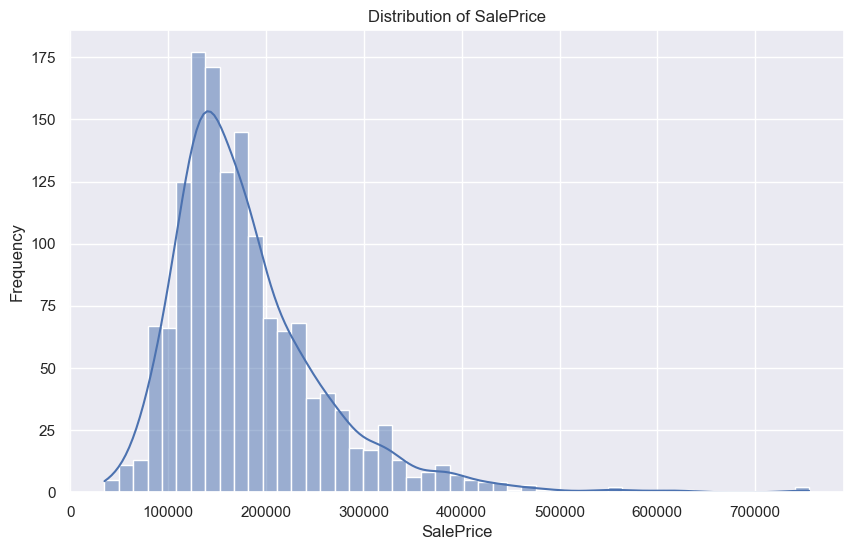

In [29]:
# Visualizing the distribution of SalePrice
plt.figure(figsize=(10,6))
sns.set(font_scale=1)
sns.histplot(train_df,x='SalePrice',kde=True,)
plt.title(f'Distribution of SalePrice')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')
plt.show()

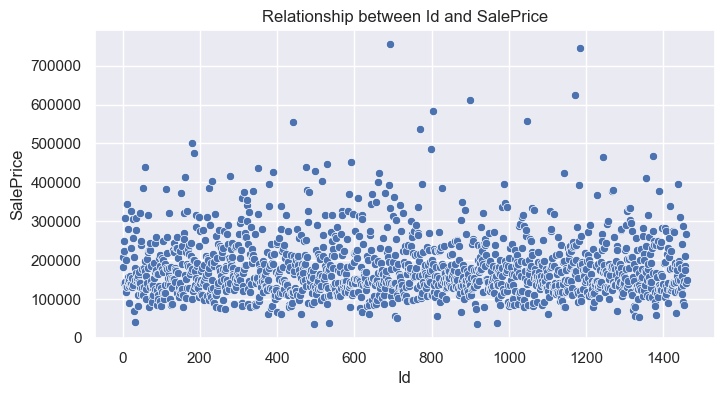

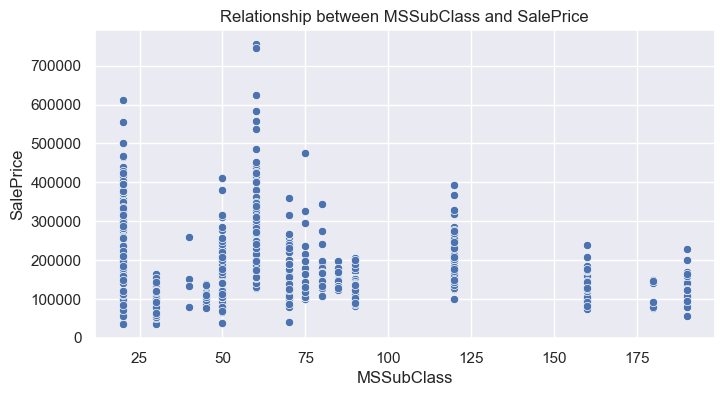

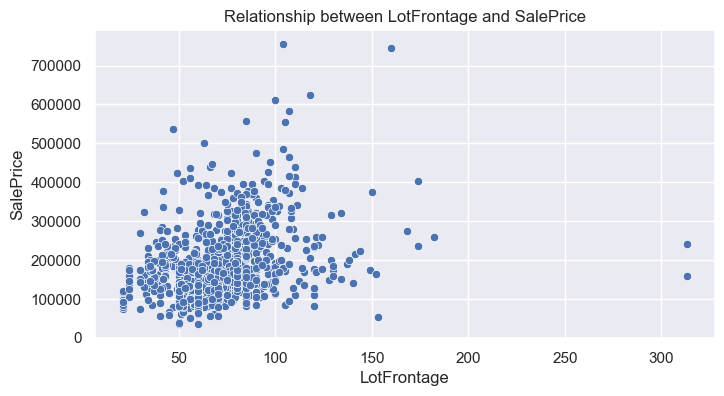

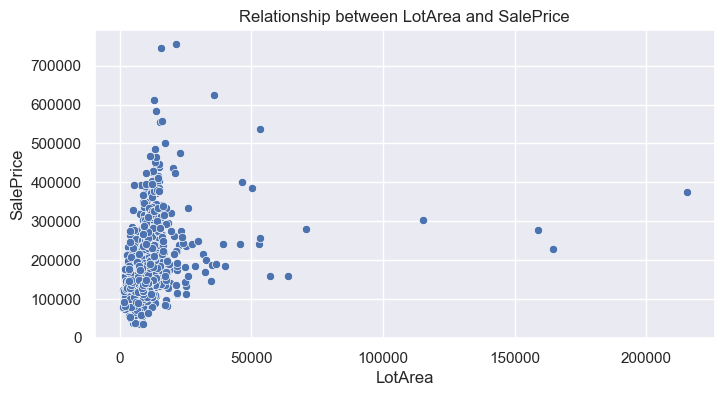

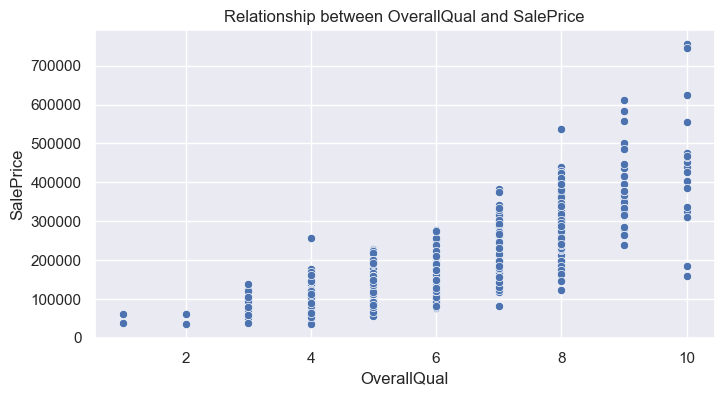

...

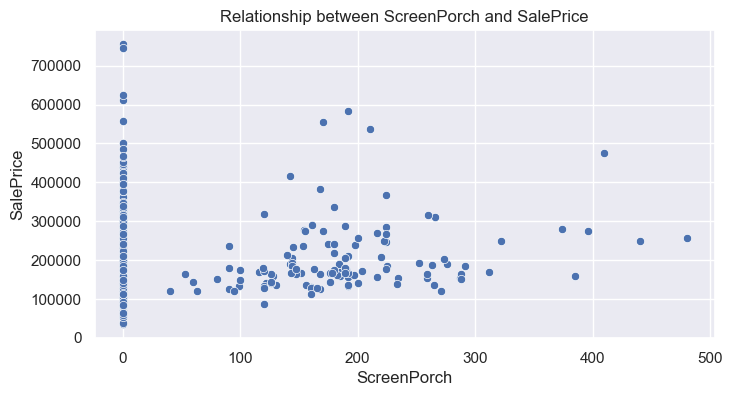

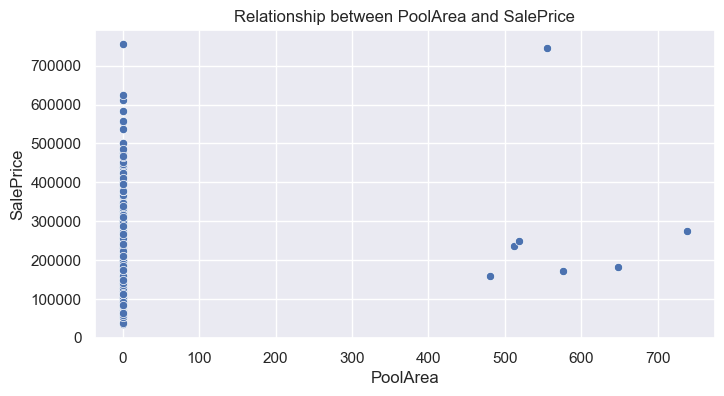

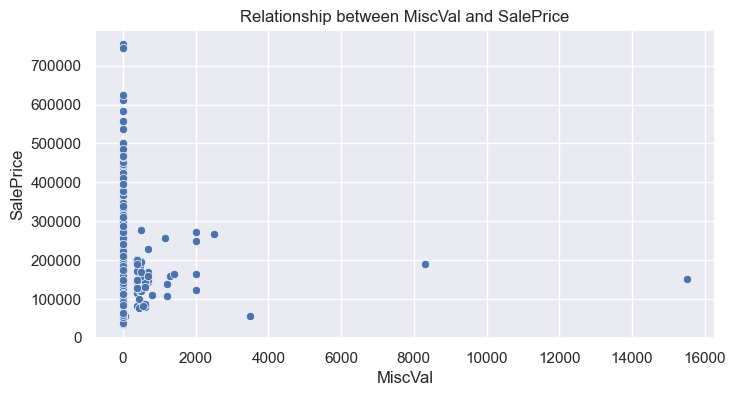

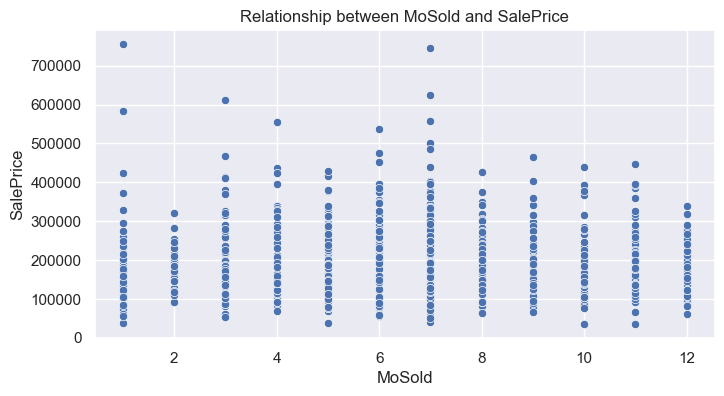

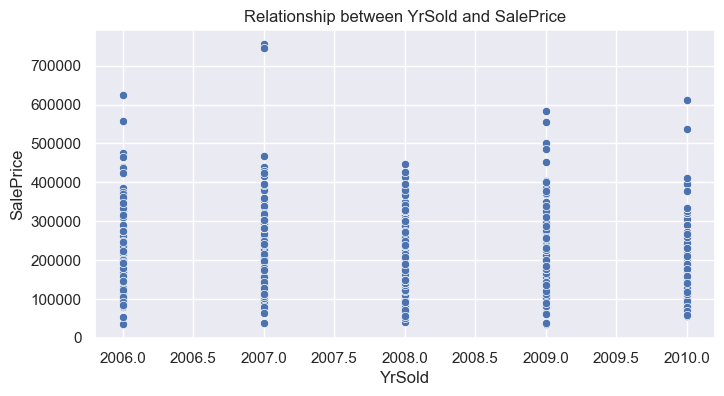

In [30]:
# Defining Target Feature
target_feature='SalePrice'

# Defining Numerical and Categorical features for visualization
numerical_features = train_df.select_dtypes(include=['int64', 'float64']).columns.drop(target_feature)
categorical_features = train_df.select_dtypes(include=['object']).columns

# Visualizing the relation between numerical feature and target feature
for feature in numerical_features:
    plt.figure(figsize=(8,4))
    sns.set(font_scale=1)
    sns.scatterplot(data=train_df,x=feature,y='SalePrice')
    plt.title(f'Relationship between {feature} and SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.show()

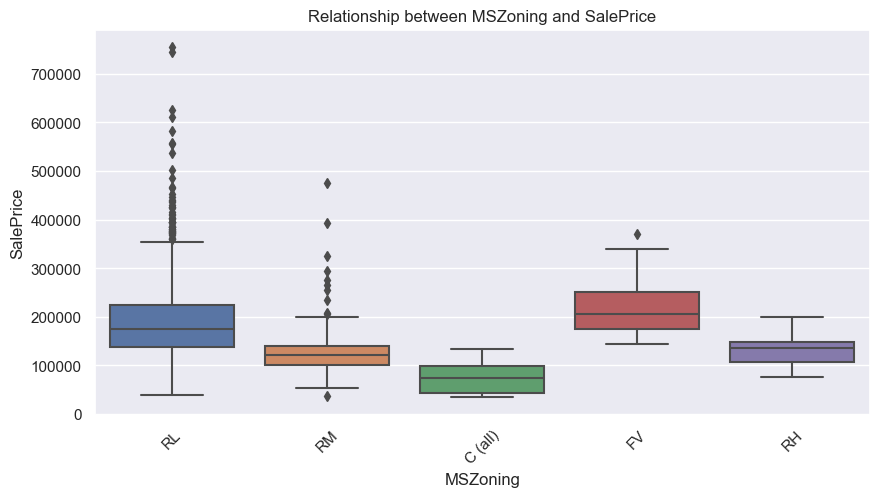

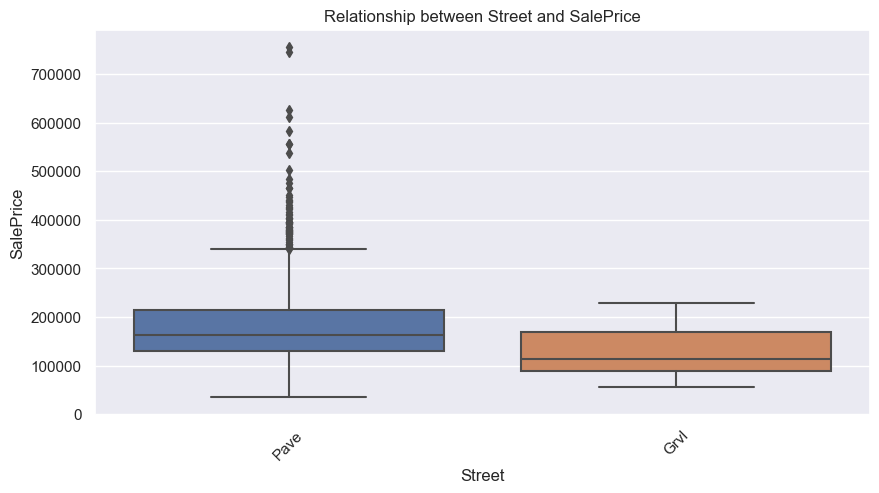

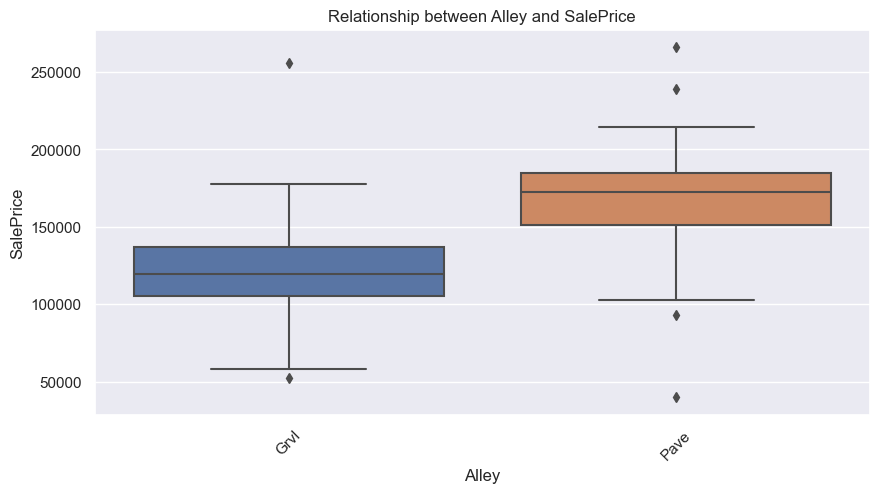

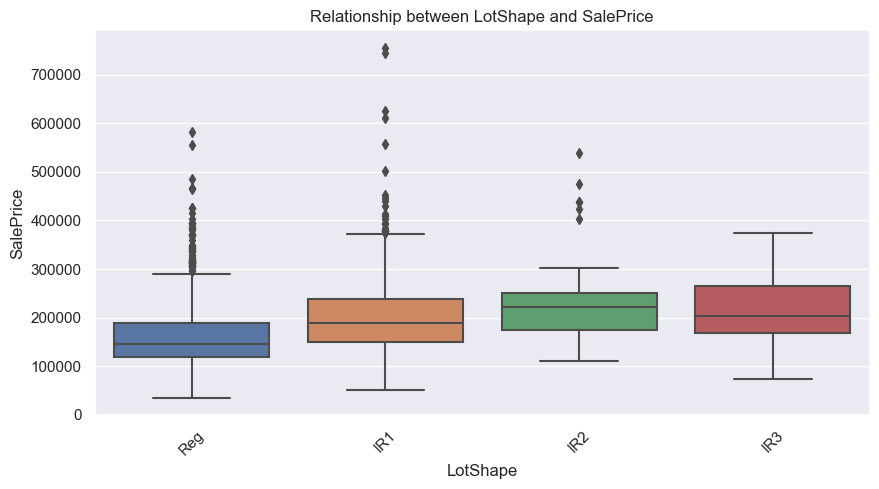

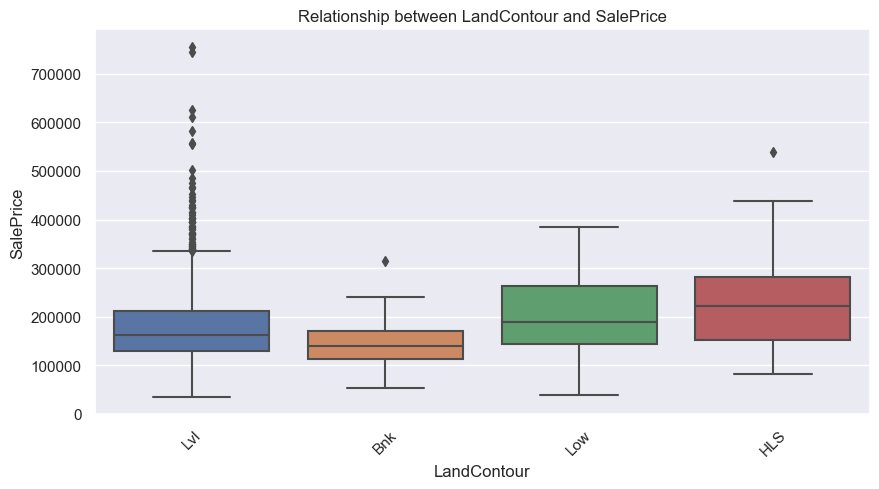

...

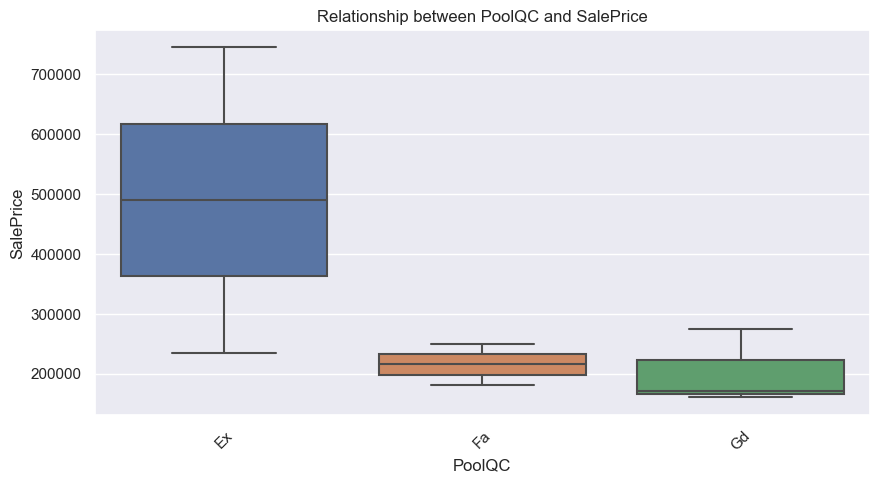

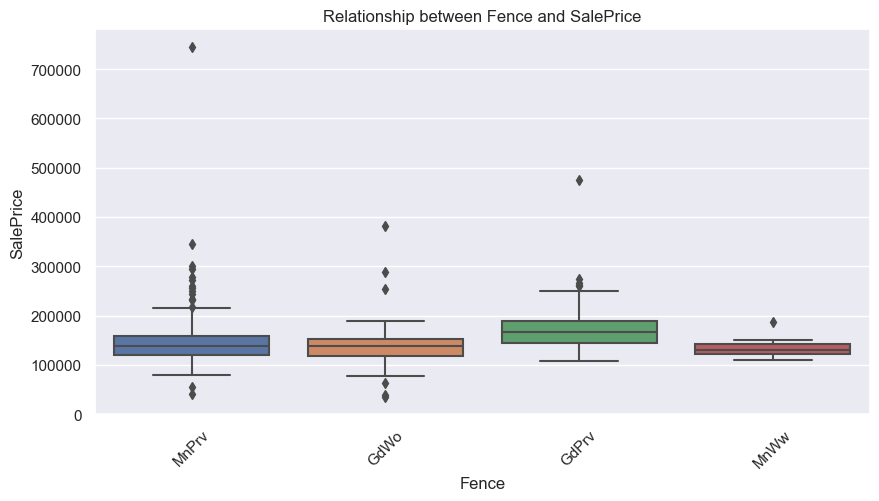

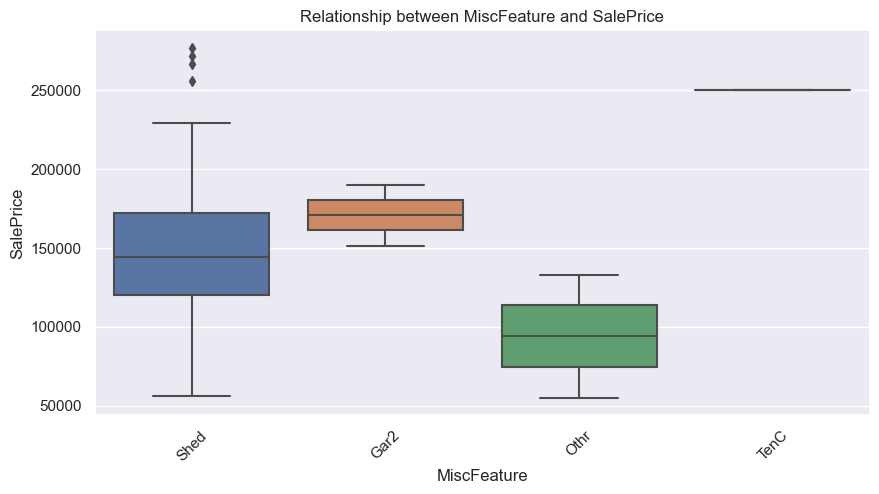

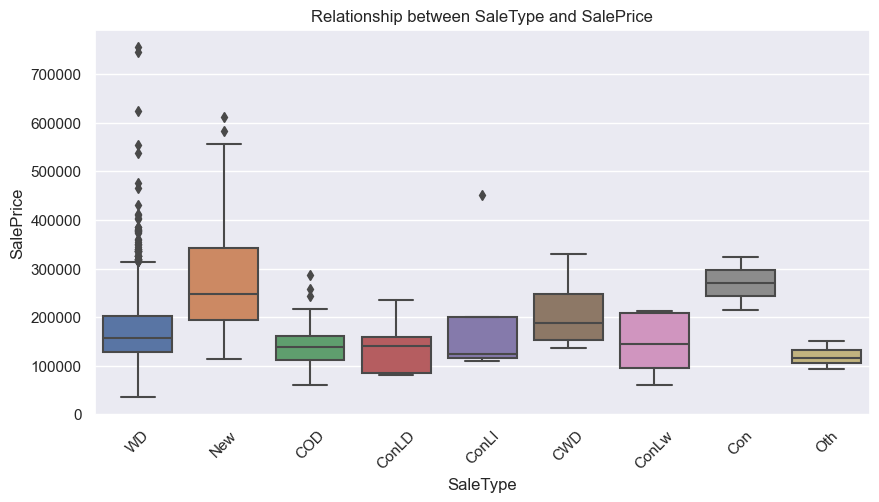

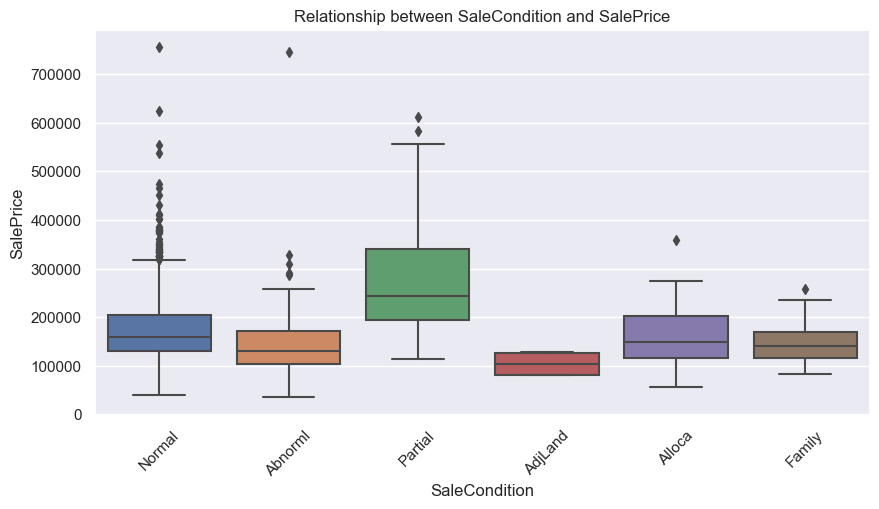

In [31]:
for feature in categorical_features:
    plt.figure(figsize=(10,5))
    sns.set(font_scale=1)
    sns.boxplot(data=train_df,x=feature,y='SalePrice')
    plt.title(f'Relationship between {feature} and SalePrice')
    plt.xlabel(feature)
    plt.ylabel('SalePrice')
    plt.xticks(rotation=45)
    plt.show()

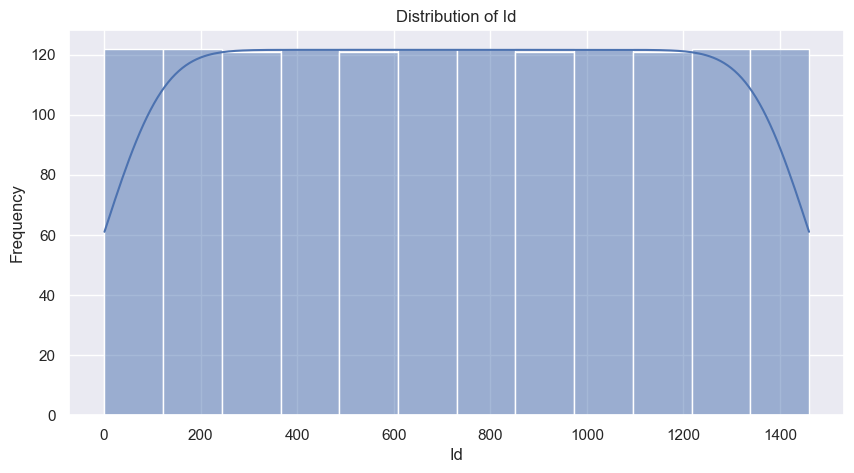

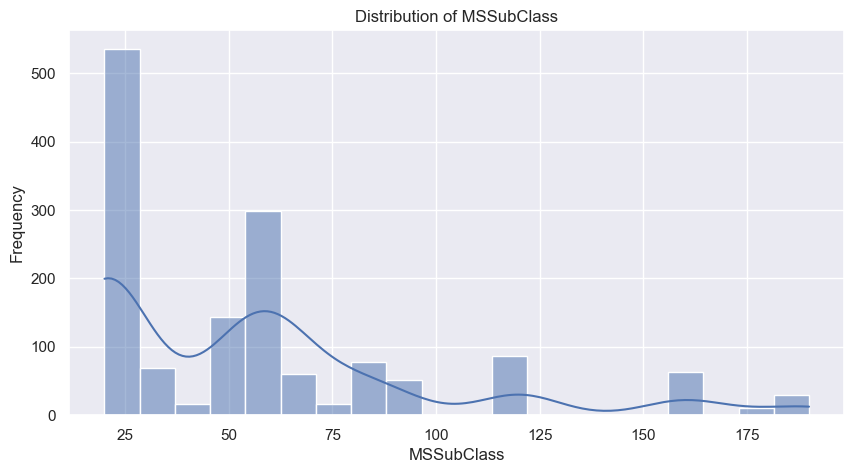

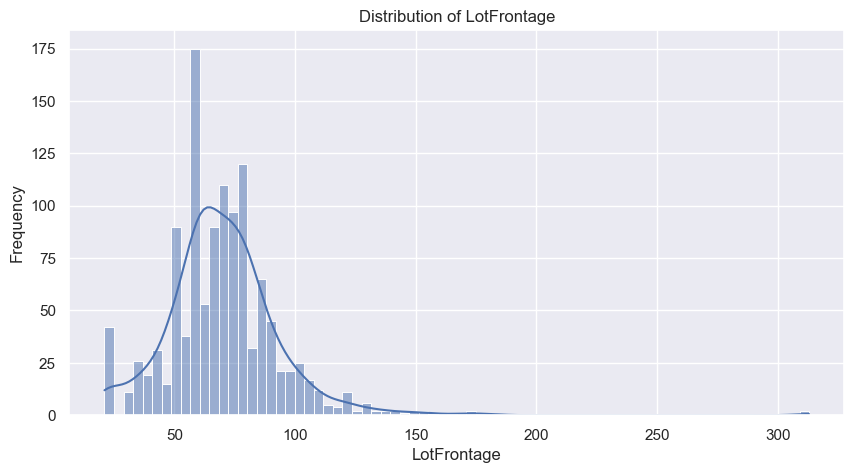

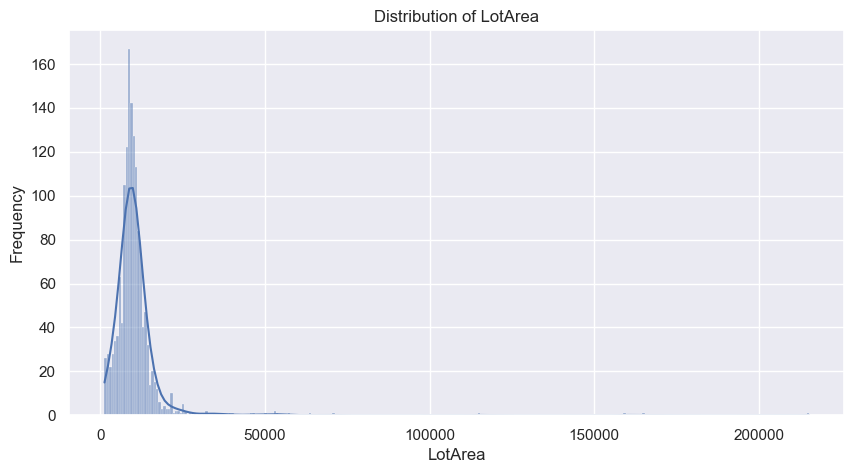

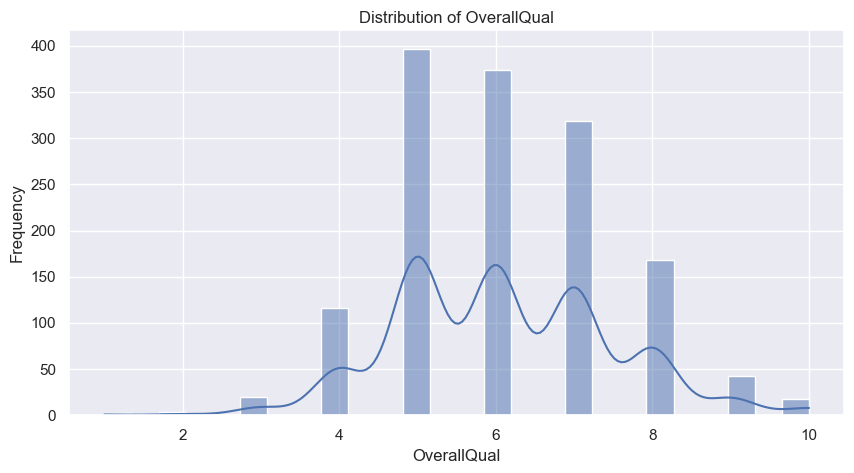

...

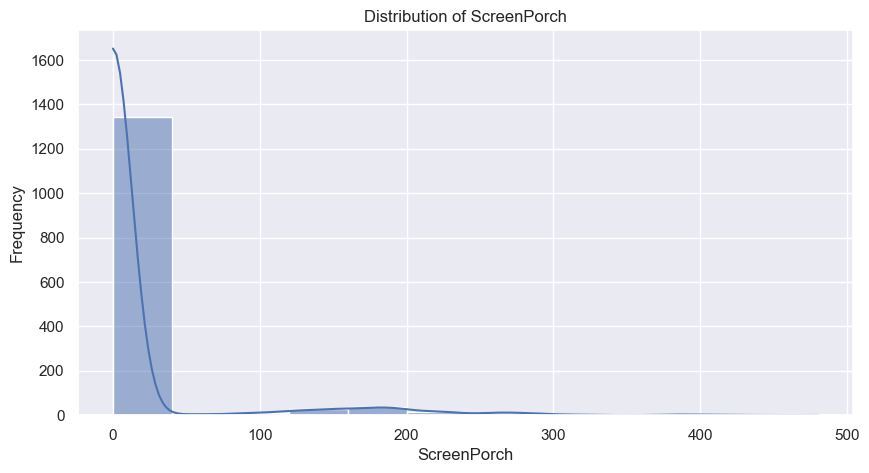

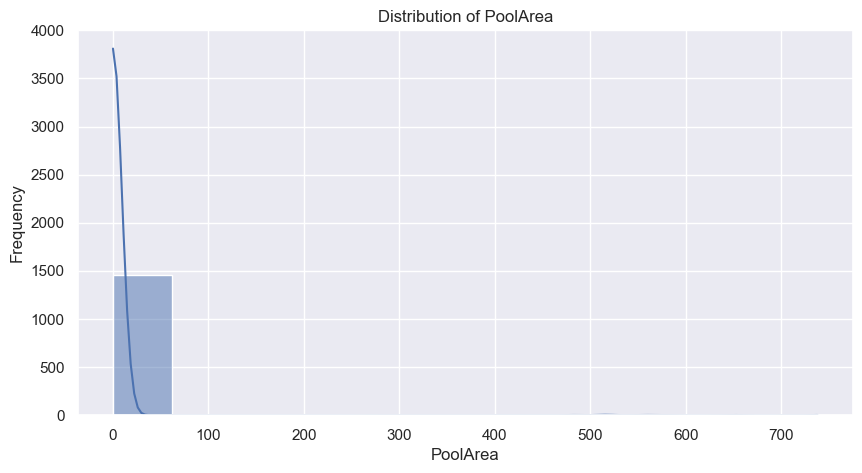

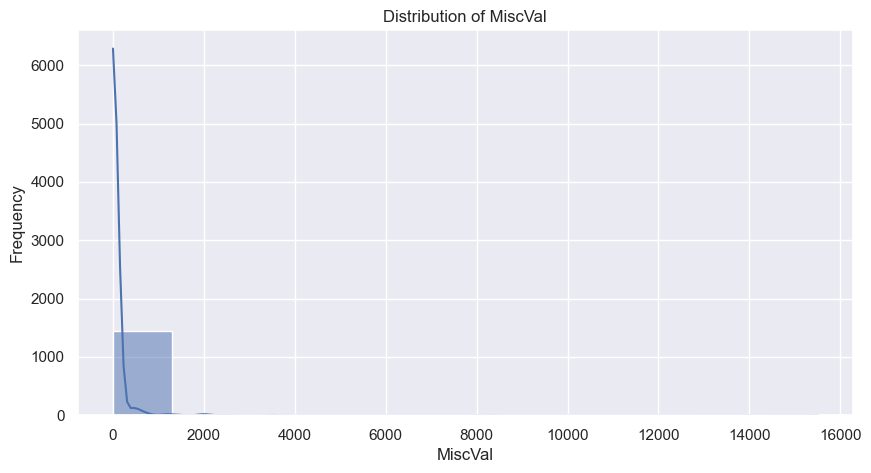

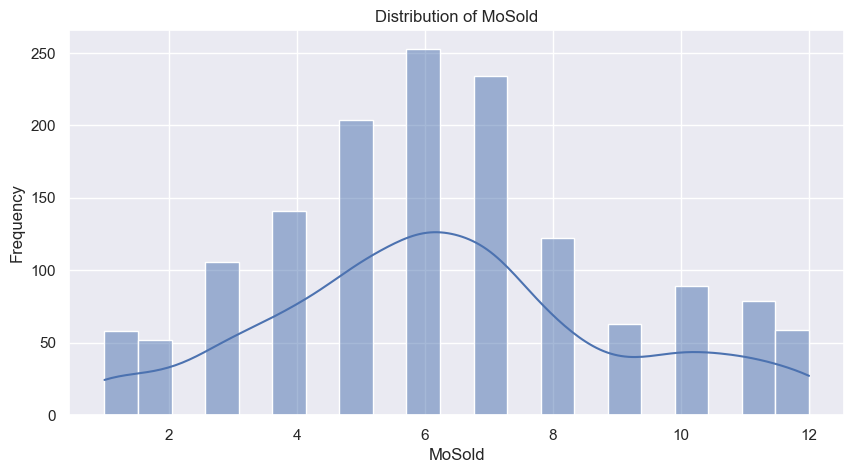

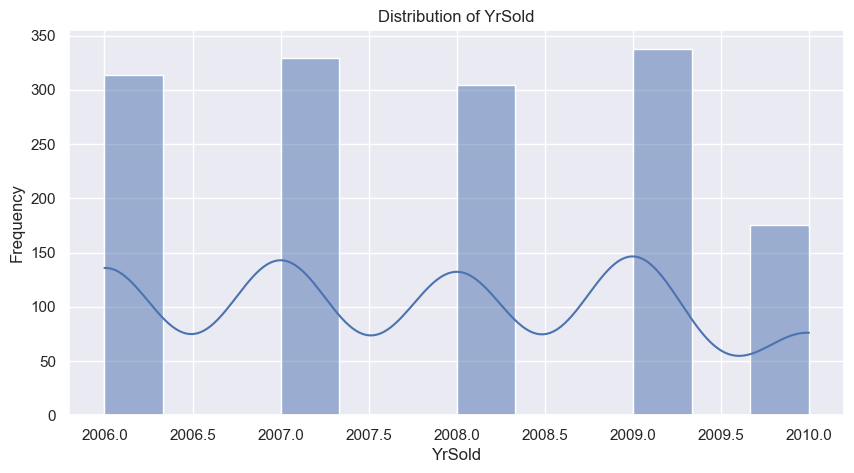

In [32]:
for feature in numerical_features:
    plt.figure(figsize=(10,5))
    sns.set(font_scale=1)
    sns.histplot(data=train_df,x=feature,kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

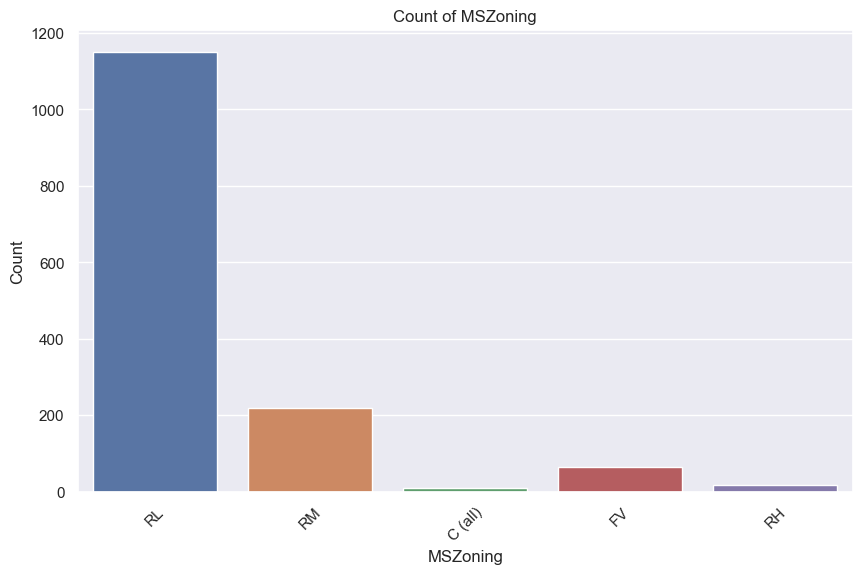

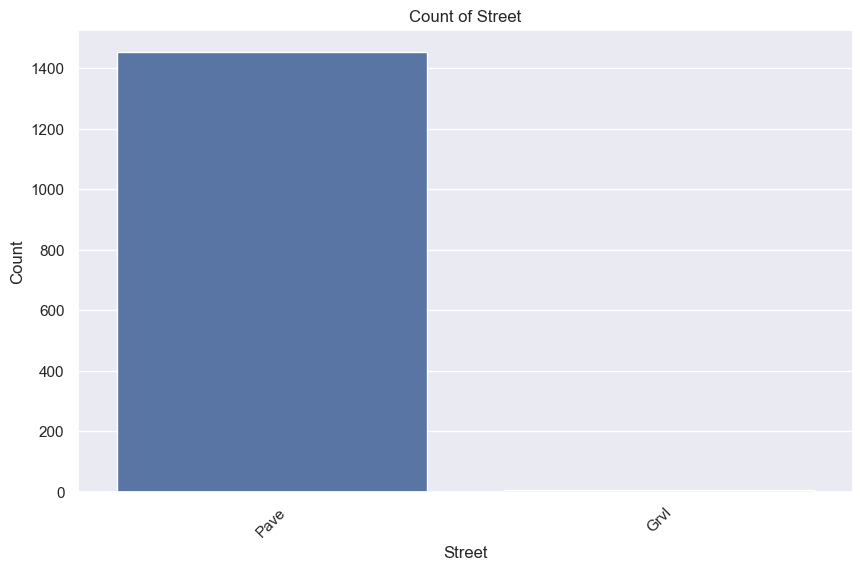

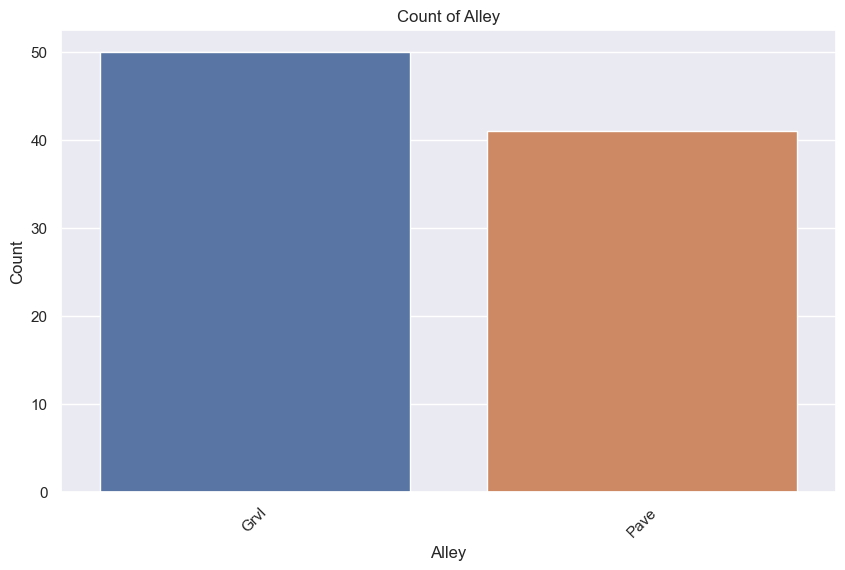

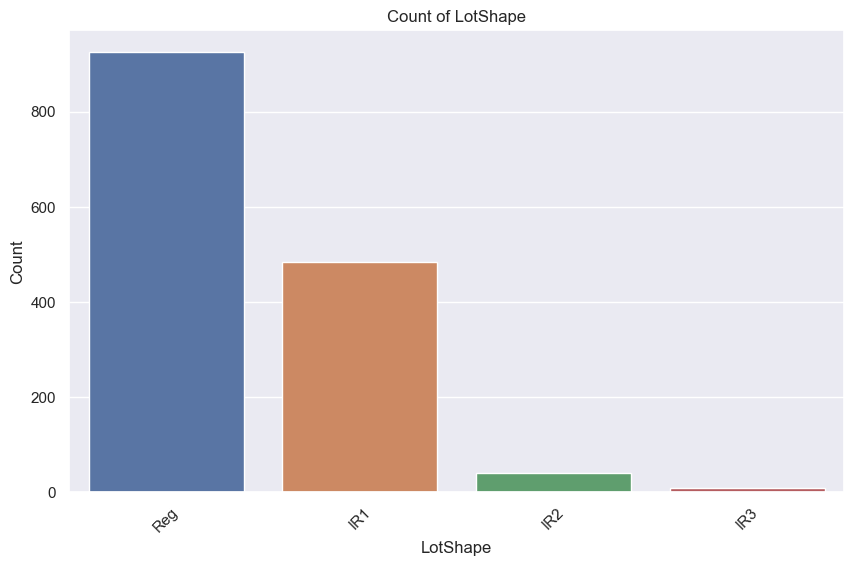

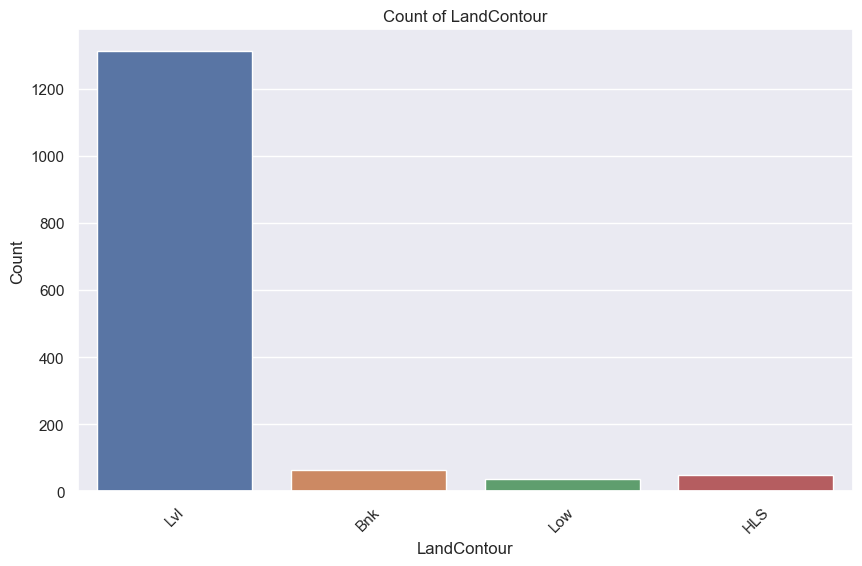

...

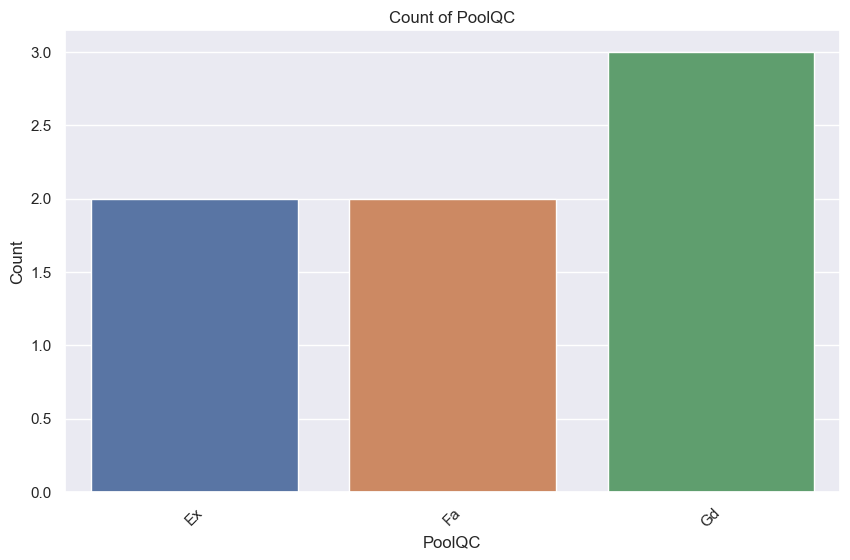

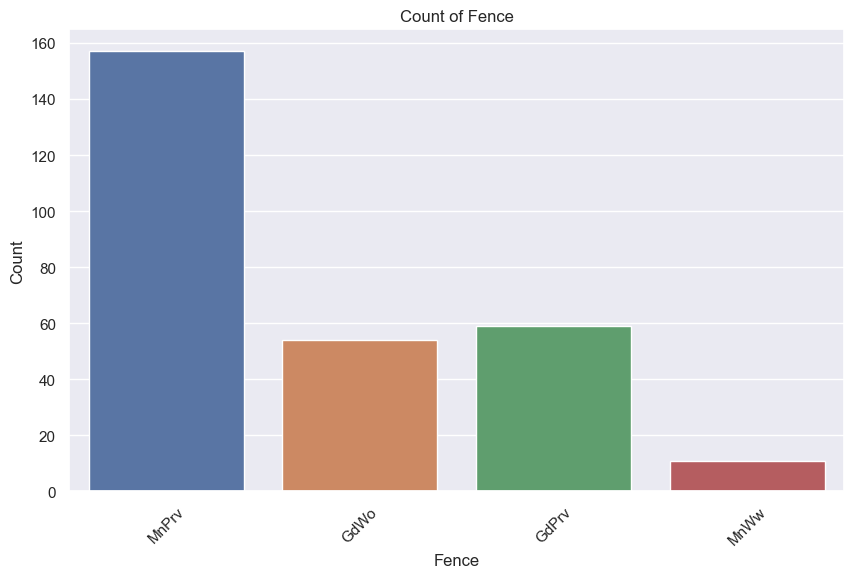

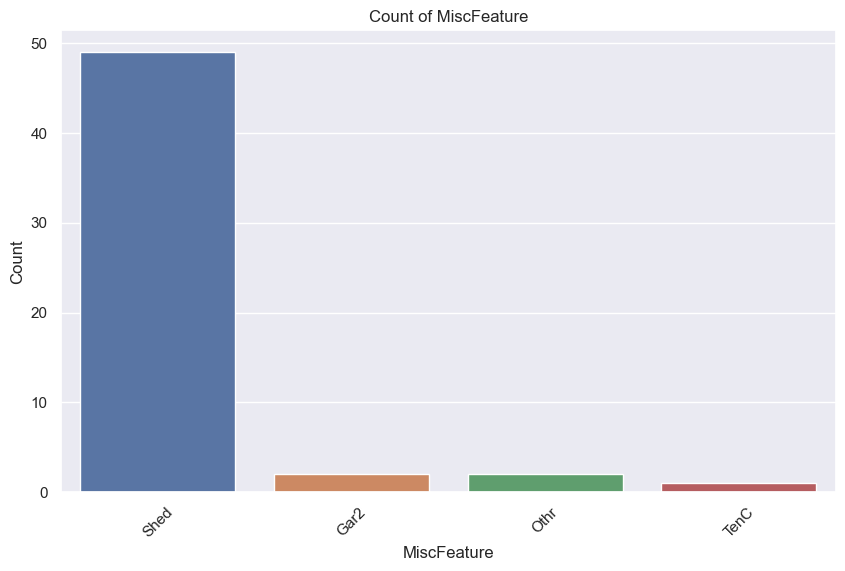

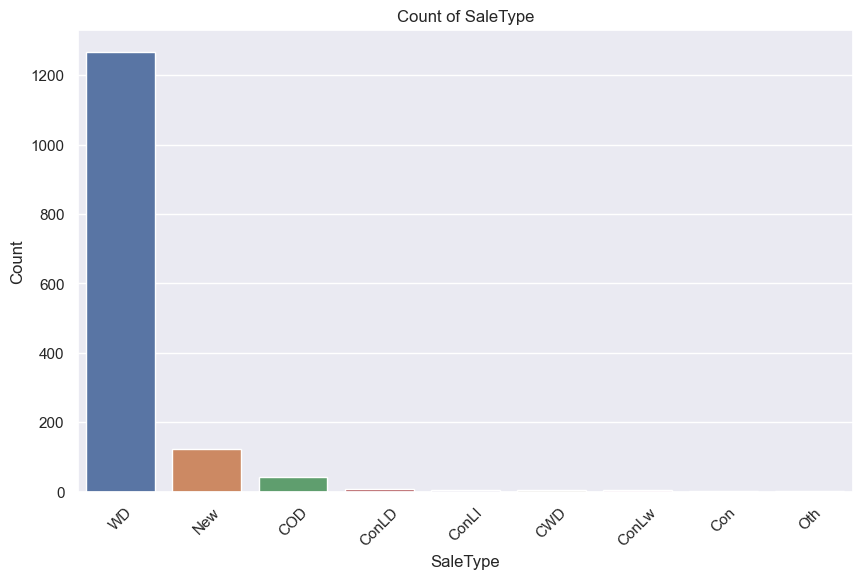

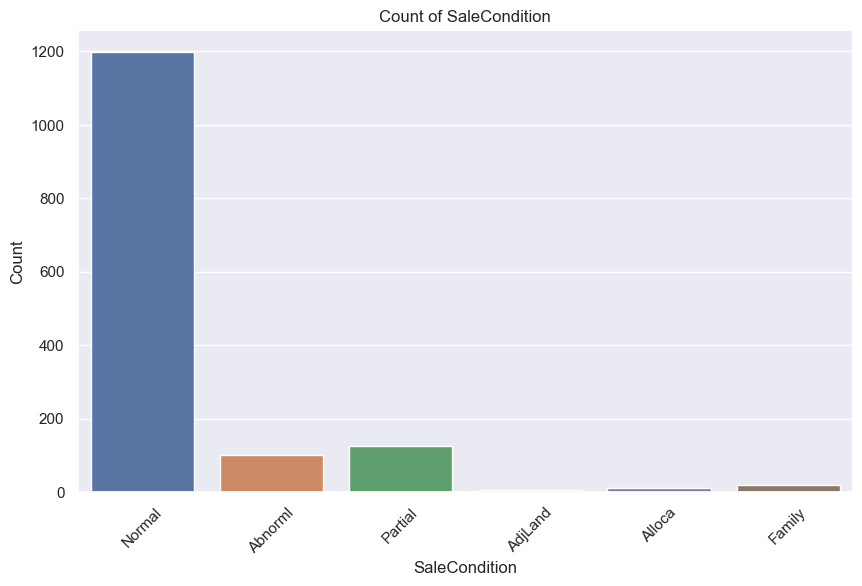

In [33]:
for feature in categorical_features:
    plt.figure(figsize=(10, 6))
    sns.set(font_scale=1)
    sns.countplot(x=feature, data=train_df)
    plt.title(f'Count of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()


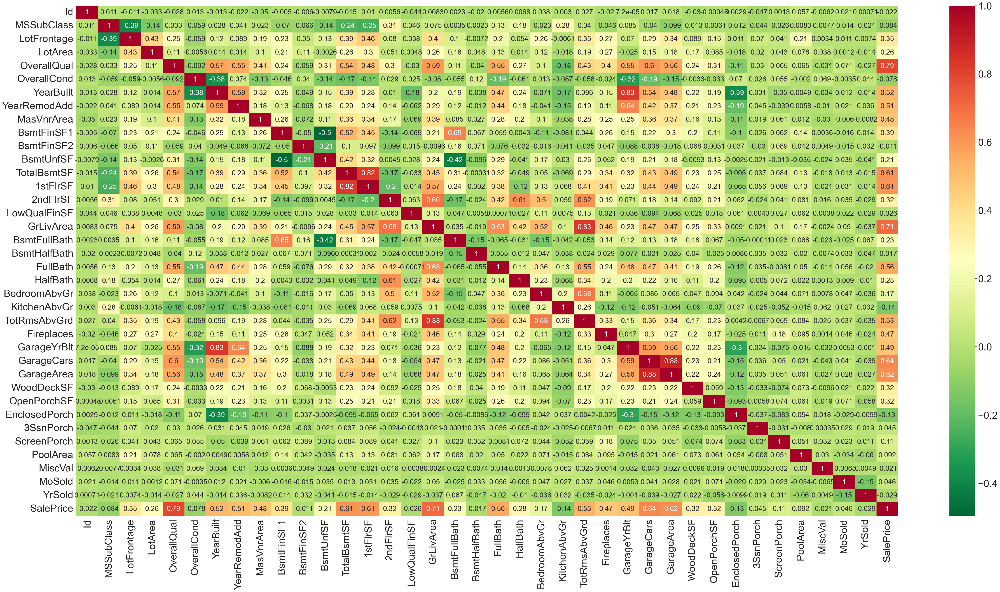

In [34]:
# Correlation between features
plt.figure(figsize=(60,30))
sns.set(font_scale=3)
sns.heatmap(train_df.corr(),annot=True,cmap="RdYlGn_r",annot_kws={"fontsize":23})
plt.show()

In [35]:
# Drop Most Missing Value Columns
column_to_drop=['Id','Alley','FireplaceQu','PoolQC','Fence','MiscFeature' ]
train_df1=train_df.drop(column_to_drop,axis=1)
test_df1=test_df.drop(column_to_drop,axis=1)

# Defining Numerical and Categorical features for Model
numerical_features1 = train_df1.select_dtypes(include=['int64', 'float64']).columns.drop(target_feature)
categorical_features1 = train_df1.select_dtypes(include=['object']).columns

# Preprocessing pipeline for numerical feature
numerical_transformer=Pipeline([('impute',SimpleImputer(strategy='median')),
                                ('scaling',StandardScaler())])

# Preprocessing pipeline for categorical feature
categorical_transformer=Pipeline([('impute',SimpleImputer(strategy='most_frequent')),
                                  ('encoding',OneHotEncoder(drop='first'))])

preprocessor=ColumnTransformer(transformers=[('num',numerical_transformer,numerical_features1),
                                             ('cat',categorical_transformer,categorical_features1)])

pipeline=Pipeline([('preprocessor',preprocessor)])

# Preprocessing the data
train_df_transformed=pipeline.fit_transform(train_df1.drop(columns=[target_feature])).toarray()

test_df_transformed=pipeline.transform(test_df1).toarray()


In [36]:
# Separating Independent and dependent variable
X=train_df_transformed
y=train_df[target_feature]

In [37]:
# Splitting into train and test
X_train,X_val,y_train,y_val=train_test_split(X,y,test_size=0.25,random_state=42)

In [38]:
model=RandomForestRegressor(random_state=42)
model.fit(X_train,y_train)

RandomForestRegressor(random_state=42)

In [49]:
# Get the numerical features after preprocessing
numerical_features_transformed = pipeline.named_steps['preprocessor'] \
                                         .named_transformers_['num'] \
                                         .named_steps['scaling'] \
                                         .get_feature_names_out(input_features=numerical_features1)

# Get the categorical features after preprocessing
categorical_features_transformed = pipeline.named_steps['preprocessor'] \
                                            .named_transformers_['cat'] \
                                            .named_steps['encoding'] \
                                            .get_feature_names_out(input_features=categorical_features1)

# Concatenate the transformed numerical and categorical feature names
preprocessed_features = np.concatenate([numerical_features_transformed, categorical_features_transformed])

# Create DataFrame for feature importances
feature_importance = model.feature_importances_
feature_important_df = pd.DataFrame({'Feature': preprocessed_features, 'Importance': feature_importance})



<AxesSubplot:ylabel='Feature'>

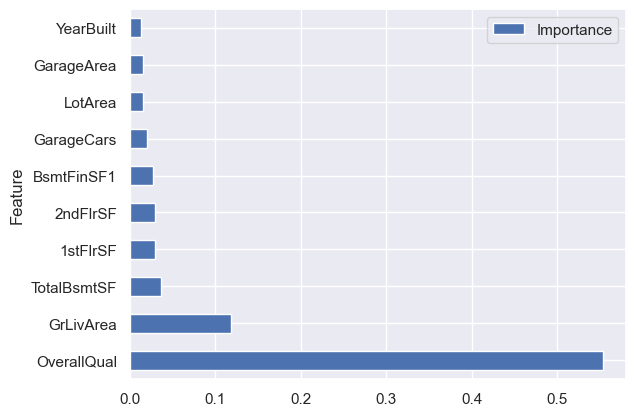

In [69]:
feature_important_df.sort_values(by='Importance',ascending=False).head(10).plot(kind='barh',x='Feature',y='Importance')